In [4]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import os
import IPython.display as ipd

In [1]:
#For trimming of audio
from pydub import AudioSegment 

#Load the .wav file
audio = AudioSegment.from_wav("jazz.wav")

#Define start and end times in milliseconds
start_time = 1000  #Start at 5 seconds
end_time = 15000   #End at 15 seconds

# Trim the audio
trimmed_audio = audio[start_time:end_time]

# Export the trimmed audio
trimmed_audio.export("output.wav", format="wav")


<_io.BufferedRandom name='output.wav'>

In [2]:
jazz_file = "output.wav"

In [5]:
ipd.Audio(jazz_file)

In [9]:
#loding audio file with librosa
jazz,sr = librosa.load(jazz_file)

In [10]:
#ROOT MEAN SQUARED ENERGY WITH LIBROSA

In [11]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [14]:
rms_jazz = librosa.feature.rms(y=jazz, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [19]:
frames = range(len(rms_jazz))
time = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

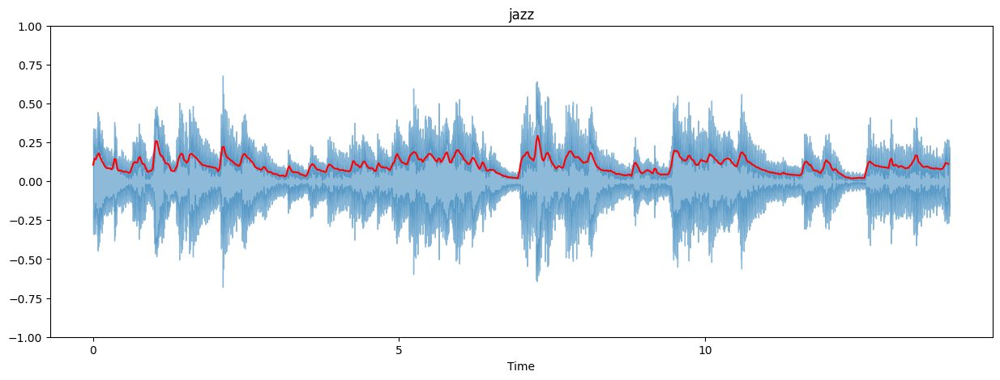

In [20]:
# rms energy is graphed in red

plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(jazz, alpha=0.5)
plt.plot(time, rms_jazz, color="r")
plt.ylim((-1, 1))
plt.title("jazz")
plt.show()

In [22]:
#RMSE with NUMPY & FORMULA

# RMSE Formula:
# RMSE = sqrt((1/N) * sum(x[n]^2 for n in range(N)))
# Where:
#   - N is the number of samples in the frame
#   - x[n] is the amplitude of the n-th sample in the frame

In [23]:
#Rmse from scratch
def rmse(signal, frame_size, hop_length):
    rmse = []
    
    # calculate rmse for each frame
    for i in range(0, len(signal), hop_length): 
        rmse_current_frame = np.sqrt(sum(signal[i:i+frame_size]**2) / frame_size)
        rmse.append(rmse_current_frame)
    return np.array(rmse)

In [24]:
rms_jazz1 = rmse(jazz, FRAME_SIZE, HOP_LENGTH)

Text(0.5, 1.0, 'jazz')

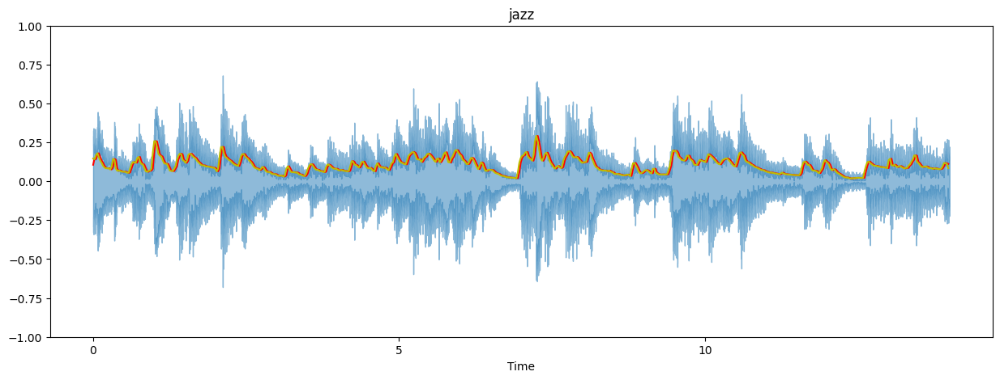

In [72]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(jazz, alpha=0.5)
plt.plot(time, rms_jazz, color="r")
plt.plot(time, rms_jazz1, color="y")
plt.ylim((-1, 1))
plt.title("jazz")

In [ ]:
#NOW ZERO CROSSING RATE WITH LIBROSA

In [39]:
zcr_jazz = librosa.feature.zero_crossing_rate(jazz, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [33]:
zcr_jazz.size

603

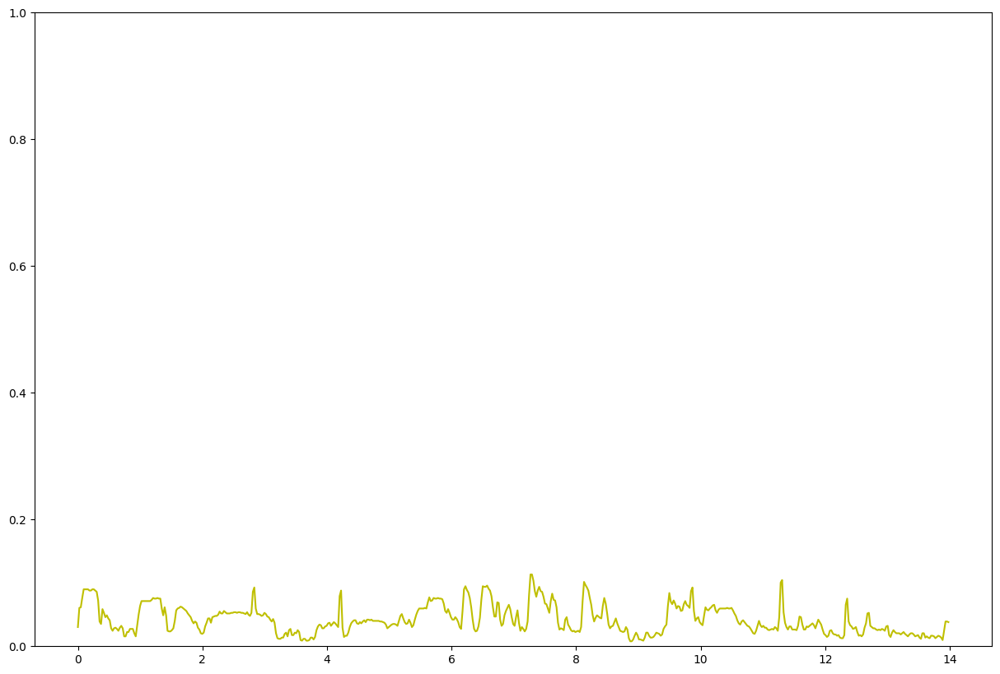

In [40]:
#GRAPH for zcr (normalized) || multiply zcr_jazz * FRAME_SIZE to get the actual valued graph.
plt.figure(figsize=(15, 10))

plt.plot(time, zcr_jazz, color="y")
plt.ylim(0, 1)
plt.show()

In [47]:
#COMPARING TWO AUDIOS ZCR 

In [48]:
#Trimming  audios
from pydub import AudioSegment 

#Load the .wav file
audio = AudioSegment.from_wav("noise.wav")
audio1 = AudioSegment.from_wav("harvard.wav")

#Define start and end times in milliseconds
start_time = 1000  #Start at 5 seconds
end_time = 15000   #End at 15 seconds

# Trim the audio
trimmed_audio = audio[start_time:end_time]
trimmed_audio1 = audio1[start_time:end_time]

# Export the trimmed audio
trimmed_audio.export("test_audio1.wav", format="wav")
trimmed_audio1.export("test_noise1.wav", format="wav")


<_io.BufferedRandom name='test_noise1.wav'>

In [61]:
Frame_len = 1024
Hop_len = 512

In [57]:
noise_file = "test_audio1.wav"
audio_file = "test_noise1.wav"

In [58]:
ipd.Audio(audio_file)

In [59]:
ipd.Audio(noise_file)

In [68]:
audio,sr = librosa.load(audio_file)
noise,_ = librosa.load(noise_file)

In [73]:
zcr_audio = librosa.feature.zero_crossing_rate(y = audio, frame_length=Frame_len, hop_length=Hop_len)[0]

zcr_noise = librosa.feature.zero_crossing_rate(y = noise, frame_length=Frame_len, hop_length=Hop_len)[0]

In [74]:
frames = range(len(zcr_audio))
time = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

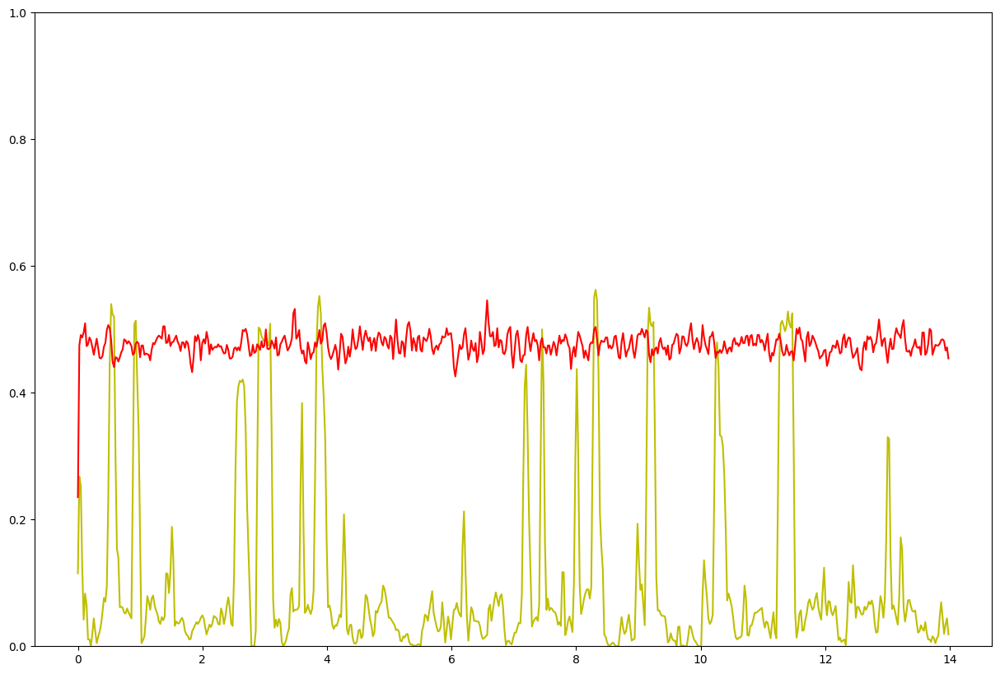

In [75]:
#camparing zcr of both audio
plt.figure(figsize=(15, 10))

plt.plot(time, zcr_audio, color="y")
plt.plot(time, zcr_noise, color="r")
plt.ylim(0, 1)
plt.show()